In [2]:
import numpy as np
import matplotlib.pyplot as plt

def display_one_file_indexbase(P_MU_LIST, TIME_RANGE_LIST, DISTANCE_LIST=None, beta=None, ylim=None):
  start_angle = -180
  end_angle = 175
  theta = np.linspace(start_angle, end_angle, num=((end_angle-start_angle) // 5) + 1)
  theta = np.deg2rad(theta)

  P_MU_LIST_mean = np.mean(P_MU_LIST, axis=2)
  
  P_MU_LIST_log = 10 * np.log10(P_MU_LIST_mean)
  
  col_num = 5
  row_num = P_MU_LIST_mean.shape[0] // 5 + 1
  
  plt.figure(figsize=(24, row_num * 5))

  for i in range(P_MU_LIST_mean.shape[0]):

    ax = plt.subplot(
      row_num, col_num, i+1, projection="polar"
    )
    ax.plot(theta, P_MU_LIST_mean[i])
    if ylim is not None:
      ax.set_ylim(ylim)

    if DISTANCE_LIST is not None:
      ax.set_title(f"dist: {DISTANCE_LIST[i]} num: {i}")
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
  

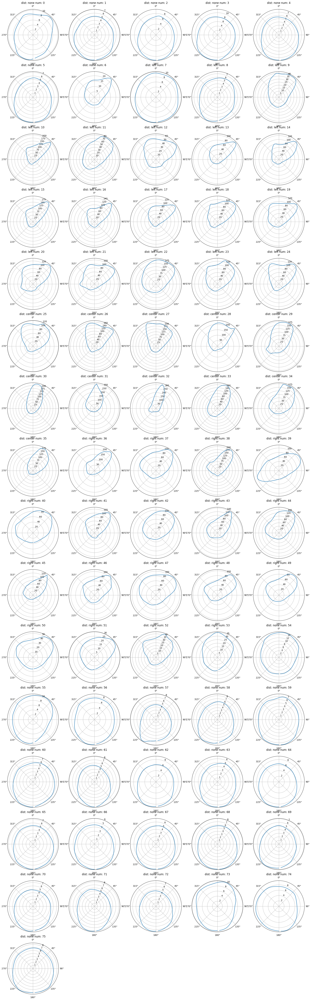

In [23]:
P_MU_LIST_path = "/home/nishimura-k/audioprocessing/datas/npy_MUSIC/150_ltor_data50/150_ltor_1.npy"
AREA_LABEL_LIST_path = "/home/nishimura-k/audioprocessing/datas/npy_AREA_label/150_ltor_data50/150_ltor_1.npy"

P_MU_LIST = np.load(P_MU_LIST_path)
AREA_LABEL_LIST = np.load(AREA_LABEL_LIST_path, allow_pickle=True)

display_one_file_indexbase(P_MU_LIST, TIME_RANGE_LIST=None, DISTANCE_LIST=AREA_LABEL_LIST)


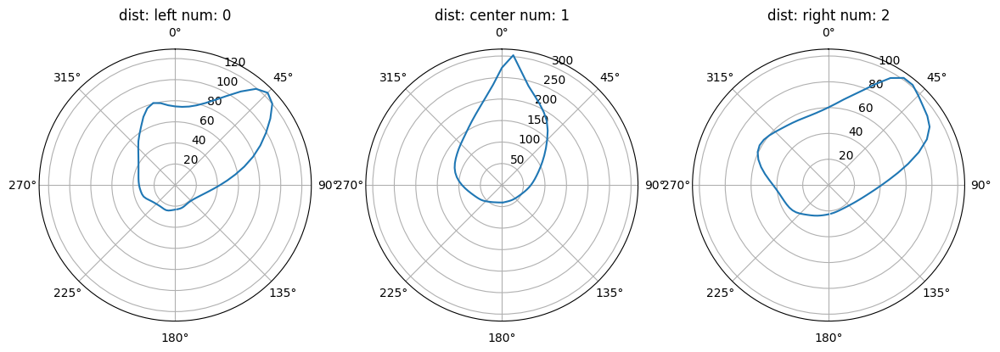

In [24]:
P_MU_left = P_MU_LIST[14]
P_MU_center = P_MU_LIST[31]
P_MU_right = P_MU_LIST[48]

display_one_file_indexbase([P_MU_left, P_MU_center, P_MU_right], TIME_RANGE_LIST=None, DISTANCE_LIST=["left", "center", "right"])


(72, 257)


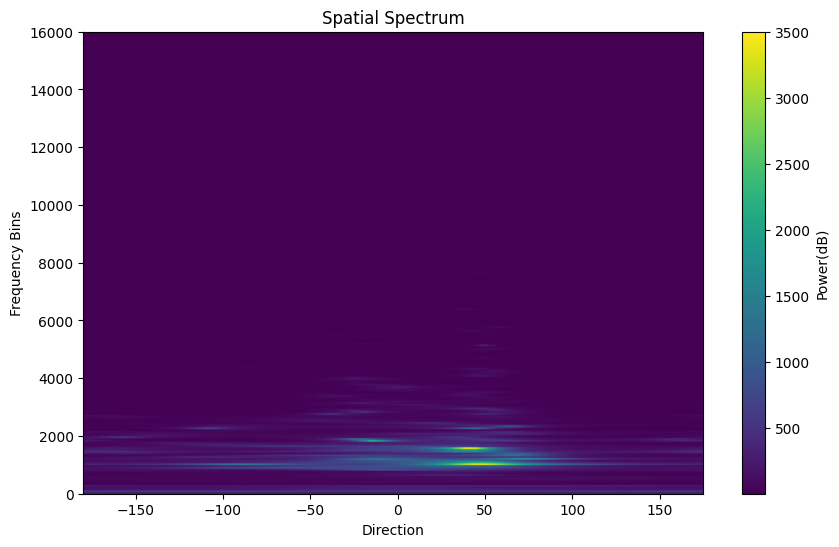

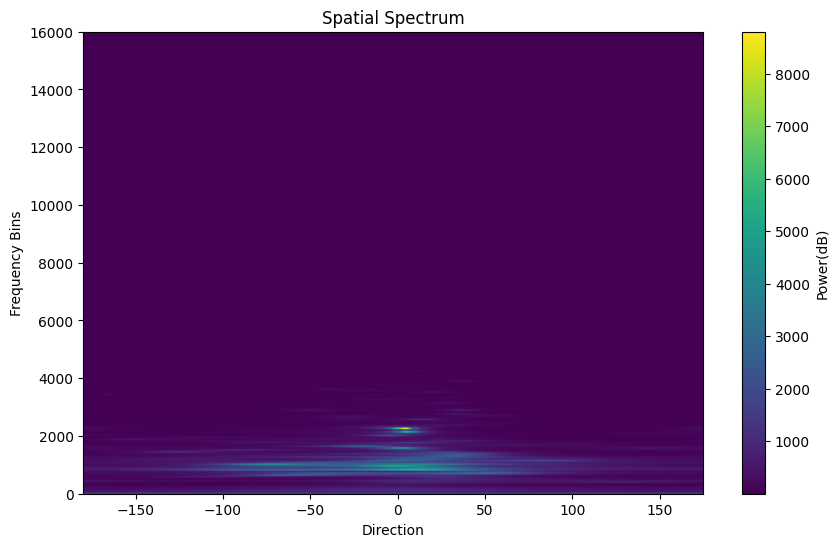

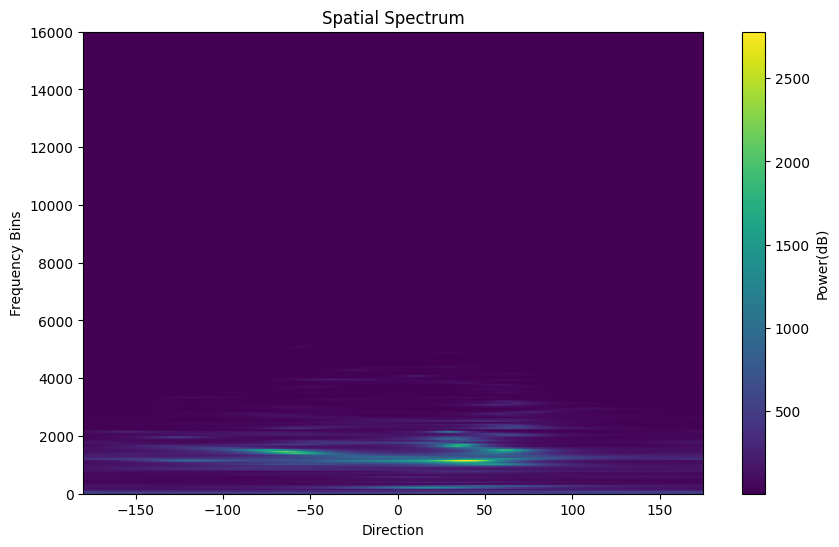

In [25]:
# 2次元を画像で可視化
print(P_MU_left.shape)
plt.figure(figsize=(10, 6))
plt.imshow(P_MU_left.T, aspect="auto", origin="lower", extent=[-180, 175, 0, 16000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_center.T, aspect="auto", origin="lower", extent=[-180, 175, 0, 16000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_right.T, aspect="auto", origin="lower", extent=[-180, 175, 0, 16000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

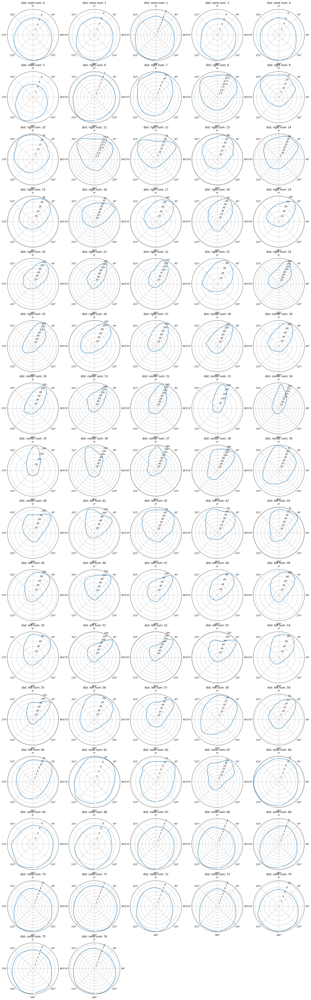

In [10]:
# rtolの場合
P_MU_LIST_path = "/home/nishimura-k/audioprocessing/datas/npy_MUSIC/150_rtol_data50/150_rtol_0.npy"
AREA_LABEL_LIST_path = "/home/nishimura-k/audioprocessing/datas/npy_AREA_label/150_rtol_data50/150_rtol_0.npy"

P_MU_LIST = np.load(P_MU_LIST_path)
AREA_LABEL_LIST = np.load(AREA_LABEL_LIST_path, allow_pickle=True)

display_one_file_indexbase(P_MU_LIST, TIME_RANGE_LIST=None, DISTANCE_LIST=AREA_LABEL_LIST)


In [22]:
# EF棟ltor
P_MU_LIST_path = "/home/nishimura-k/audioprocessing/datas/npy_MUSIC/EF/EF_ltor_150_0to59/EF_ltor_150_41.npy"
AREA_LABEL_LIST_path = "/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_41.npy"

P_MU_LIST = np.load(P_MU_LIST_path)
AREA_LABEL_LIST = np.load(AREA_LABEL_LIST_path, allow_pickle=True)
ylim = [0, 300]
display_one_file_indexbase(P_MU_LIST, TIME_RANGE_LIST=None, DISTANCE_LIST=AREA_LABEL_LIST)


FileNotFoundError: [Errno 2] No such file or directory: '/home/nishimura-k/audioprocessing/datas/npy_MUSIC/EF/EF_ltor_150_0to59/EF_ltor_150_41.npy'

(72, 257)

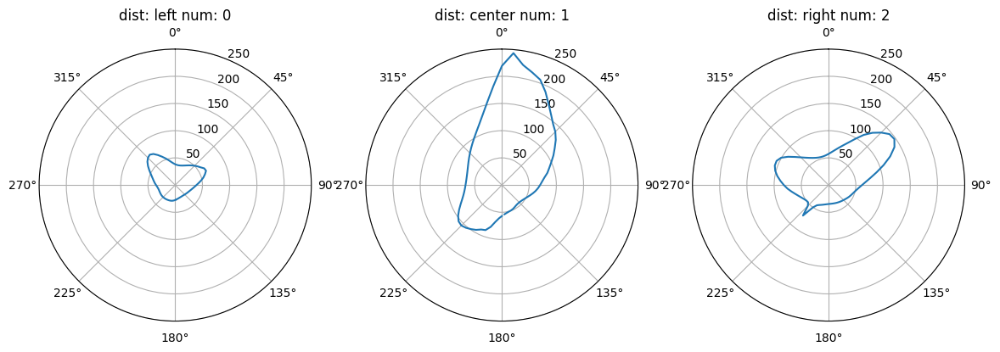

In [43]:
P_MU_left = P_MU_LIST[14]
P_MU_center = P_MU_LIST[36]
P_MU_right = P_MU_LIST[48]
ylim = [0, 250]
display_one_file_indexbase([P_MU_left, P_MU_center, P_MU_right], TIME_RANGE_LIST=None, DISTANCE_LIST=["left", "center", "right"], ylim=ylim)
P_MU_left.shape

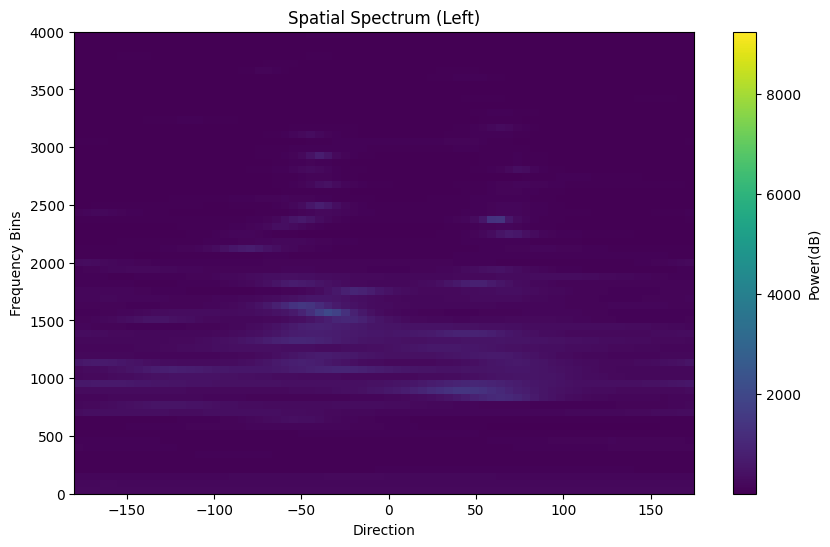

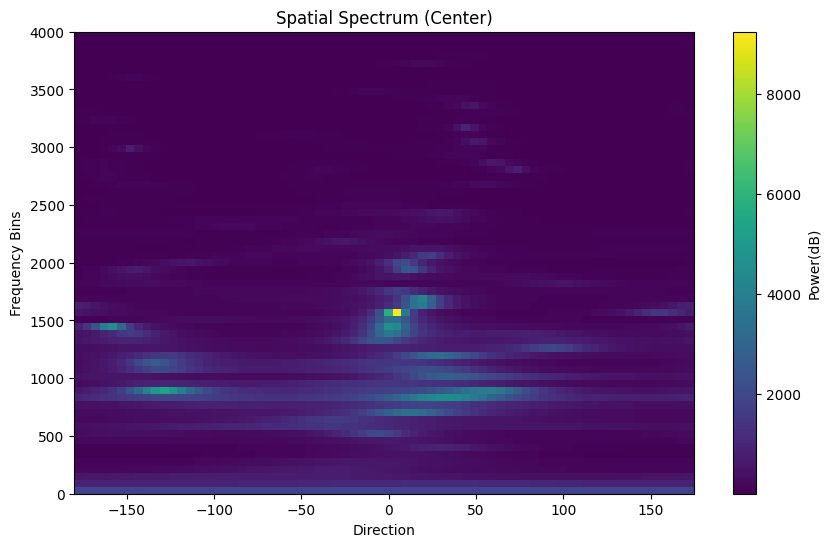

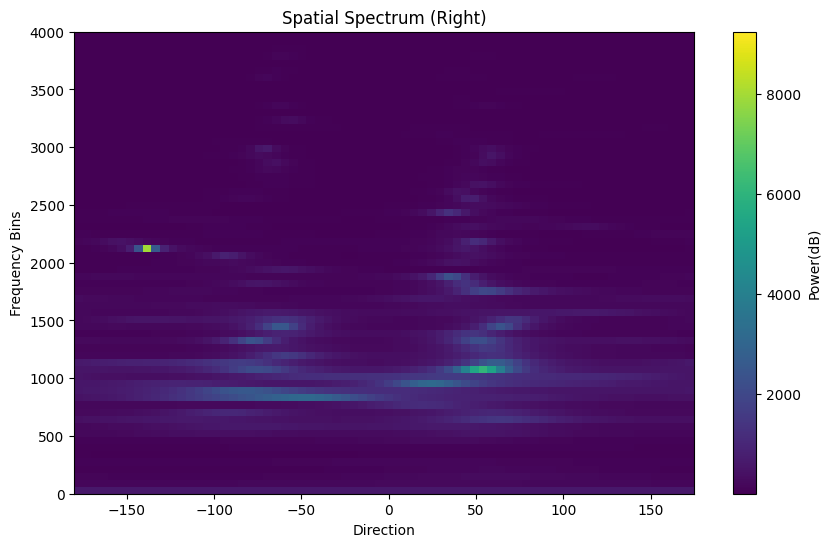

In [49]:
# 絶対的なカラースケールの範囲を決定する
min_val = min(P_MU_left.min(), P_MU_center.min(), P_MU_right.min())
max_val = max(P_MU_left.max(), P_MU_center.max(), P_MU_right.max())

# 画像表示（全て同じカラースケール範囲を設定）
plt.figure(figsize=(10, 6))
plt.imshow(P_MU_left[:, :65].T, aspect="auto", origin="lower", extent=[-180, 175, 0, 4000], vmin=min_val, vmax=max_val)
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum (Left)")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_center[:, :65].T, aspect="auto", origin="lower", extent=[-180, 175, 0, 4000], vmin=min_val, vmax=max_val)
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum (Center)")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_right[:, :65].T, aspect="auto", origin="lower", extent=[-180, 175, 0, 4000], vmin=min_val, vmax=max_val)
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum (Right)")
plt.show()


(72, 257)


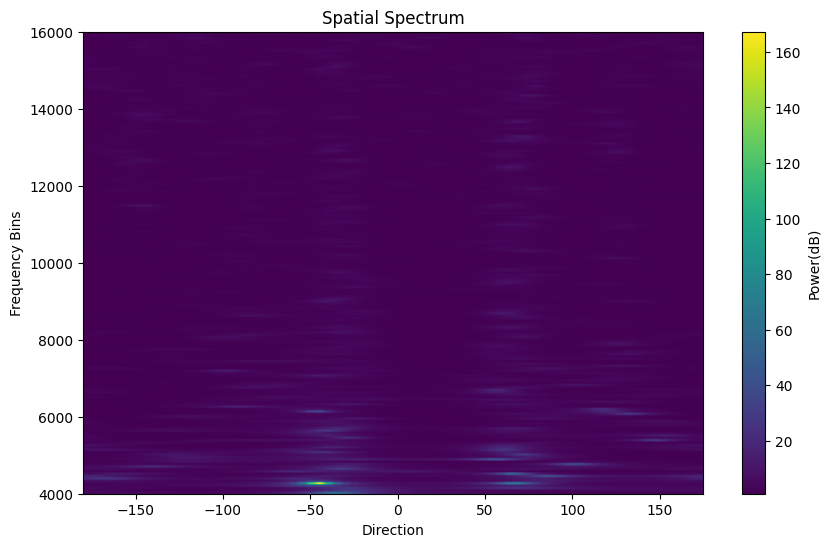

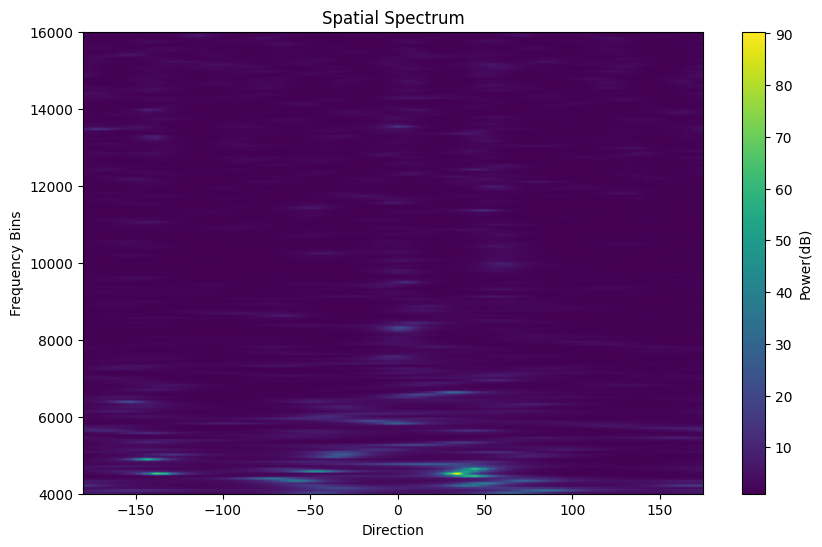

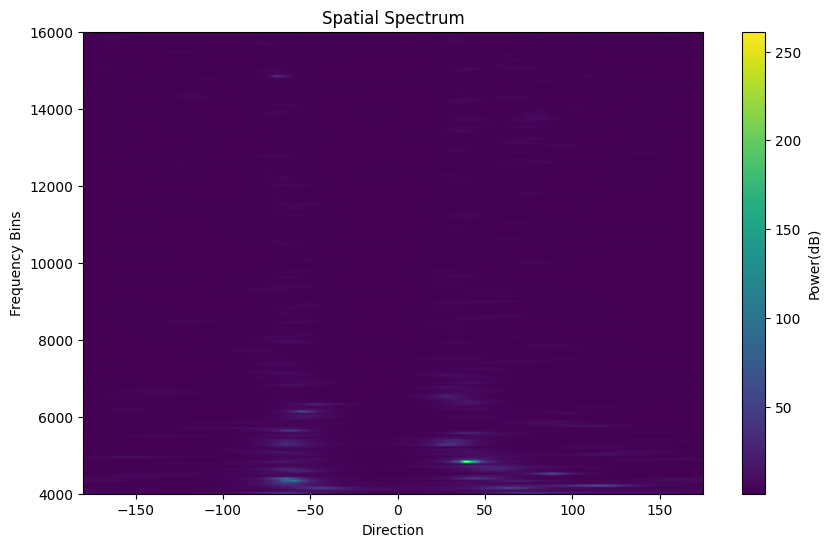

In [45]:
# 2次元を画像で可視化
print(P_MU_left.shape)
plt.figure(figsize=(10, 6))
plt.imshow(P_MU_left[:, 64:].T, aspect="auto", origin="lower", extent=[-180, 175, 4000, 16000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_center[:, 64:].T, aspect="auto", origin="lower", extent=[-180, 175, 4000, 16000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_right[:, 64:].T, aspect="auto", origin="lower", extent=[-180, 175, 4000, 16000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

/tmp/ipykernel_819535/2951675254.py:12: RuntimeWarning: invalid value encountered in log10
  P_MU_LIST_log = 10 * np.log10(P_MU_LIST_mean)


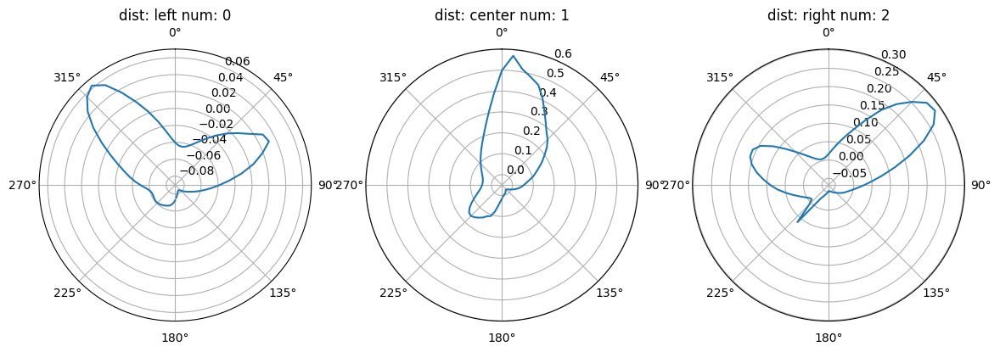

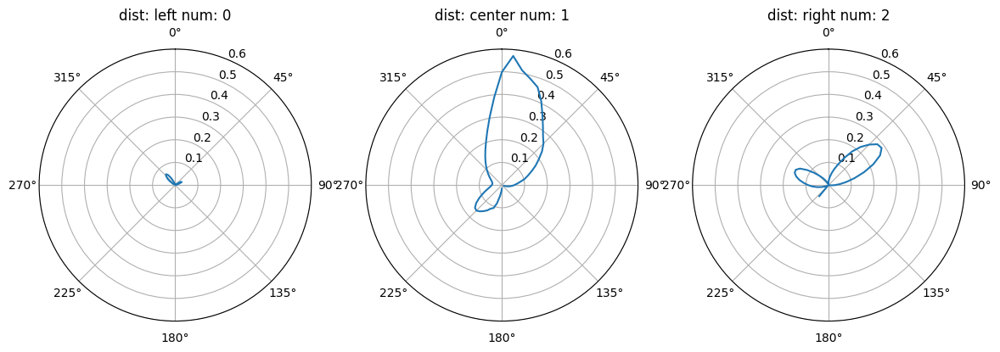

In [40]:
# std
P_MU_left = np.load("/home/nishimura-k/audioprocessing/datas_mono_st/left/EF_ltor_150_0_timestep_14.npy")
P_MU_center = np.load("/home/nishimura-k/audioprocessing/datas_mono_st/center/EF_ltor_150_0_timestep_36.npy")
P_MU_right = np.load("/home/nishimura-k/audioprocessing/datas_mono_st/right/EF_ltor_150_0_timestep_48.npy")

ylim = [0, 0.60]
display_one_file_indexbase([P_MU_left, P_MU_center, P_MU_right], TIME_RANGE_LIST=None, DISTANCE_LIST=["left", "center", "right"])
display_one_file_indexbase([P_MU_left, P_MU_center, P_MU_right], TIME_RANGE_LIST=None, DISTANCE_LIST=["left", "center", "right"], ylim=ylim)

(72, 257)


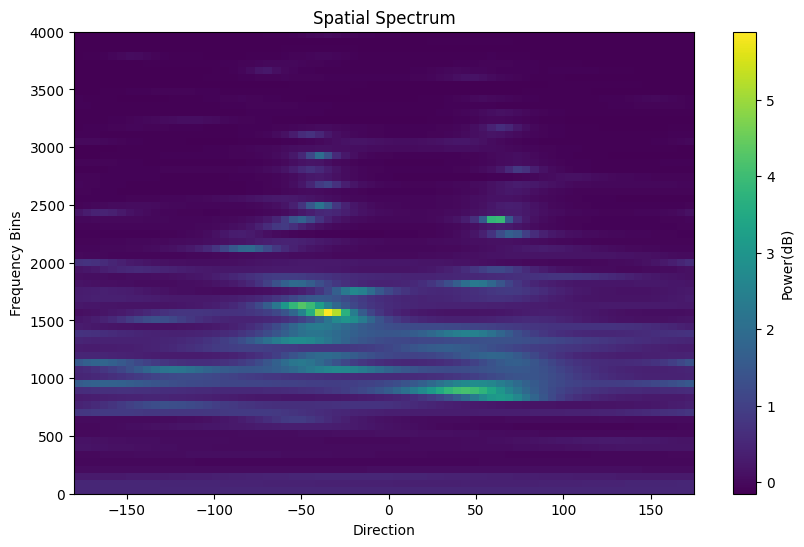

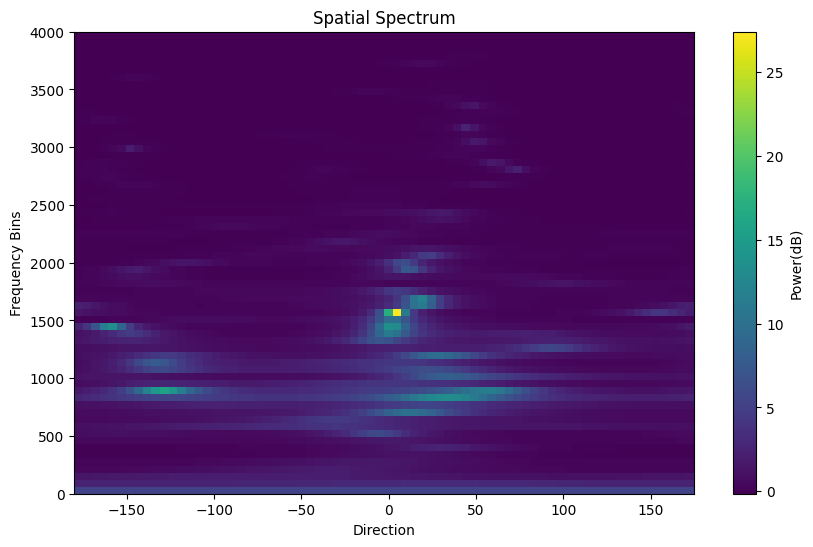

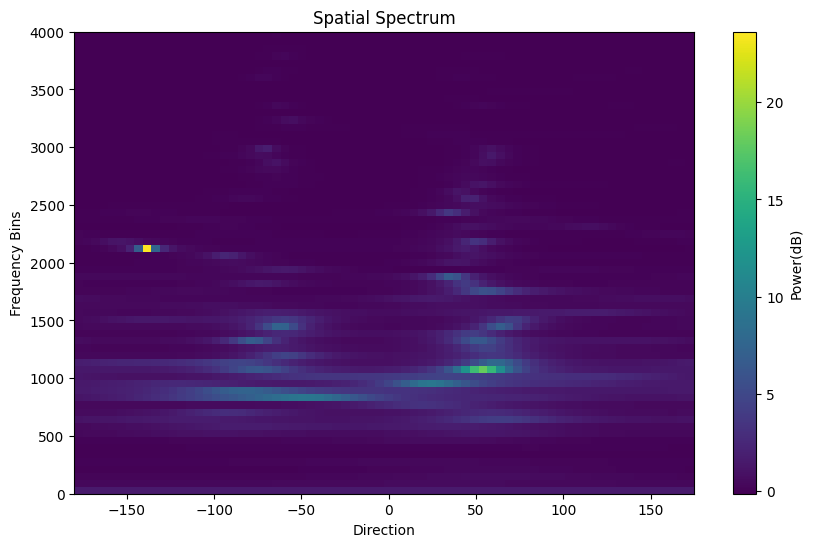

In [39]:
# 2次元を画像で可視化
print(P_MU_left.shape)
plt.figure(figsize=(10, 6))
plt.imshow(P_MU_left[:, :65].T, aspect="auto", origin="lower", extent=[-180, 175, 0, 4000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_center[:, :65].T, aspect="auto", origin="lower", extent=[-180, 175, 0, 4000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(P_MU_right[:, :65].T, aspect="auto", origin="lower", extent=[-180, 175, 0, 4000])
plt.colorbar(label="Power(dB)")
plt.xlabel("Direction")
plt.ylabel("Frequency Bins")
plt.title("Spatial Spectrum")
plt.show()

In [13]:
import glob
import os

def get_all_files_from_dirs(directories, extension="*.npy"):
  all_files = []
  for directory in directories:
    files = glob.glob(os.path.join(directory, extension))
    all_files.extend(files)

  return all_files

label_files = get_all_files_from_dirs(["/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59"])
P_MU_files = get_all_files_from_dirs(["/home/nishimura-k/audioprocessing/datas/npy_MUSIC/EF/EF_ltor_150_0to59"])

label_files.sort()
P_MU_files.sort()

print(label_files)
print(P_MU_files)

['/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_0.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_1.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_10.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_11.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_12.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_13.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_14.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_15.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_16.npy', '/home/nishimura-k/audioprocessing/datas/npy_AREA_label/EF/EF_ltor_150_0to59/EF_ltor_150_17.npy', '/home/nishimura-k/au